In [1]:
import numpy as np
from Temporal_Community_Detection import temporal_network
from helpers import *
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, f1_score
from math import floor
import random
import csv
import matplotlib as mpl

/Users/bengieru/MLN/Results/Calcium_test/Temporal_Community_Detection.py:29: UserWarning: Graph-tool requires its own environment. Restart the kernel with a gt environment to run DSBM, otherwise you can proceed.
  warnings.warn(message = 'Graph-tool requires its own environment. Restart the kernel with a gt environment to run DSBM, otherwise you can proceed.')


In [2]:
path = '/Users/bengieru/MLN/Results/Calcium_test/' ## base path
roi = 'sarah_ROI/' #roi file
epochs = ['_baseline', '_early', '_pre']
layers = 6
time = 4000

subjects = load_obj(path + 'subjects/', 'subjects')

trackable = [subjects['wt'][3], subjects['het'][6], subjects['het'][8], subjects['het'][13], subjects['het'][4], subjects['het'][3], subjects['het'][2]]

pvs = {}
pvs['%s'%trackable[0]] = load_obj(path +'subjects/','pv_wt')['%s'%trackable[0]]
for i in range(1,len(trackable)):
    temp = load_obj(path +'subjects/','pv_het')['%s'%trackable[i]]
    pvs['%s'%trackable[i]] = (np.array(temp)-1).tolist() ##adjust python indexing

num_rois_trackable = {}
for i,e in enumerate(trackable):
    for j,f in enumerate(epochs):
        num_rois_trackable['%s'%(e+f)] = read_roi(path, roi, e+f) ## number of rois

In [3]:
merged_spikes = {}
binned_binary_spikes = {}
merged_spikes = {}
for i,e in enumerate(trackable):
    with open(path + 'infomap_results_merged/' + '%s/'%e + 'binary_spikes_%s.pkl'%(e), 'rb') as handle:
        merged_spikes['%s'%(e)] = pickle.load(handle)
    binned_binary_spikes['%s'%(e)] = bin_time_series(merged_spikes['%s'%(e)], time, gaussian = True, sigma = 1.25)

In [4]:
%%time
adjacency_matrices = {}
for i,e in enumerate(trackable):  
    adjacencies = []
    for k in range(layers):
        adjacencies.append(cross_correlation_matrix(binned_binary_spikes['%s'%(e)][k])[0])
    adjacency_matrices['%s'%(e)] = adjacencies

/Users/bengieru/MLN/Results/Calcium_test/helpers.py:39: RuntimeWarning: invalid value encountered in sqrt
  x_cov_std = np.nanmax(np.sqrt(np.correlate(x - x_mean, x - x_mean, 'full')))
/Users/bengieru/MLN/Results/Calcium_test/helpers.py:40: RuntimeWarning: invalid value encountered in sqrt
  y_cov_std = np.nanmax(np.sqrt(np.correlate(y - y_mean, y - y_mean, 'full')))
/Users/bengieru/MLN/Results/Calcium_test/helpers.py:47: RuntimeWarning: invalid value encountered in true_divide
  corr_array = unnormalized_correlation/normalization


CPU times: user 49min, sys: 6.92 s, total: 49min 7s
Wall time: 49min 45s


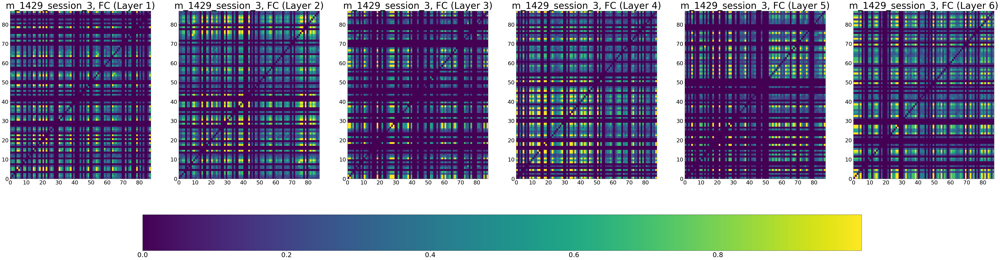

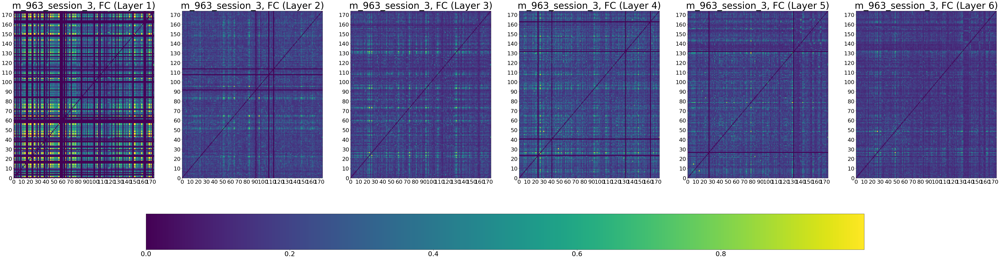

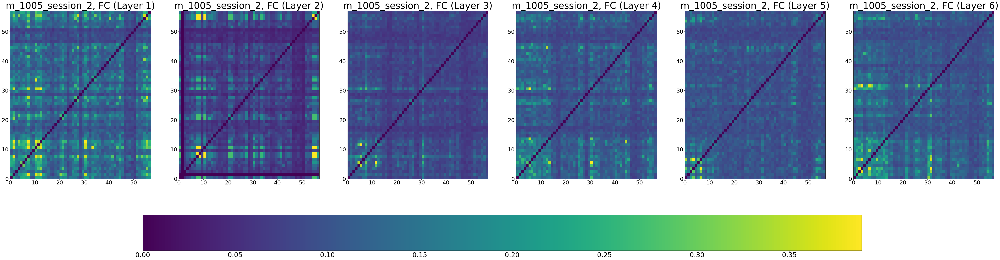

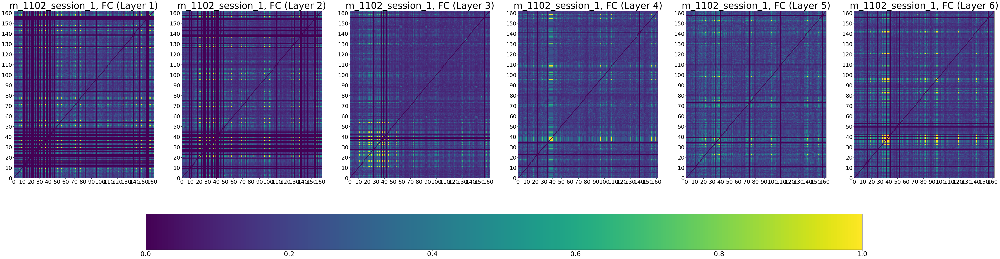

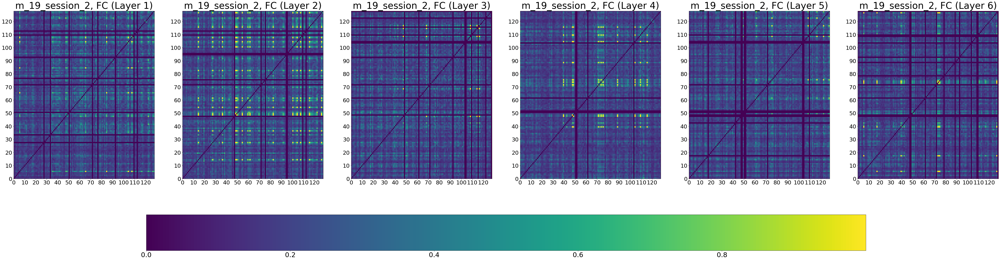

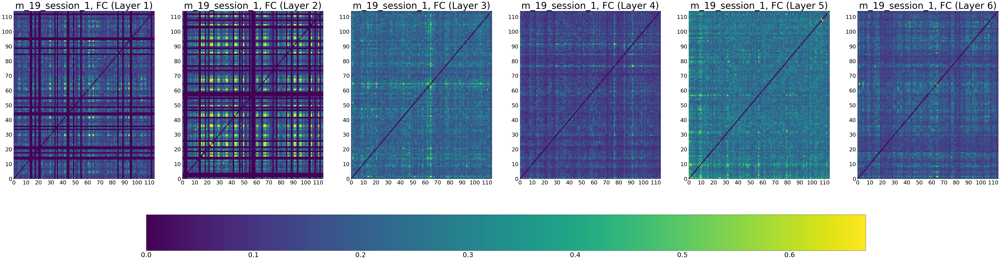

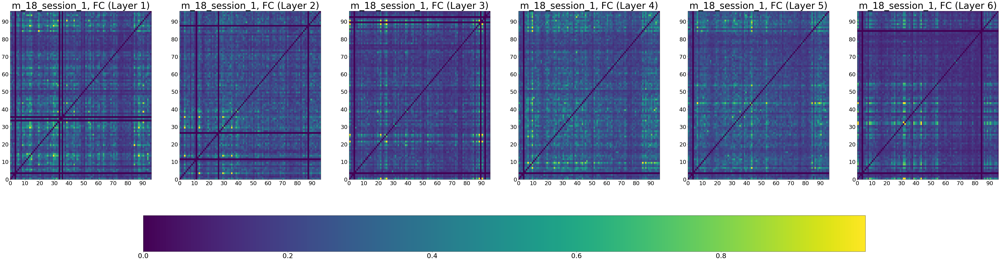

In [120]:
for i,e in enumerate(trackable):
    fig,ax = plt.subplots(1,6, figsize = (80,20))
    for q in range(6):
        k = ax[q].imshow(adjacency_matrices['%s'%(e)][q], origin = 'lower', interpolation = 'nearest', aspect='auto',  extent = [0,num_rois_trackable['%s'%(e+epochs[0])],0,num_rois_trackable['%s'%(e+epochs[0])]])
        ax[q].set_title('%s, FC (Layer %d)'%(e, q + 1), fontsize = 42)
        ax[q].set_xticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[0])]/10)+1)])
        ax[q].set_yticks([k*10 for k in range(int(num_rois_trackable['%s'%(e+epochs[0])]/10)+1)])
        ax[q].tick_params(axis = 'both', labelsize = 25)
    cbar = fig.colorbar(k, ax = ax.flat, orientation = 'horizontal')
    cbar.ax.tick_params(labelsize = 30) 
    plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'adjacencies_%s.pdf'%(e))

In [7]:
%%time
#fig,ax = plt.subplots(7,1, figsize = (40,80))
TNs = {}
for i,e in enumerate(trackable):
    #for j,f in enumerate(epochs):
    TNs['%s'%(e)] = temporal_network(num_rois_trackable['%s'%(e+f)], 
                                     layers, 
                                     time, 
                                     data = 'list__adjacency', 
                                     list_adjacency = adjacency_matrices['%s'%(e)], 
                                     omega = 1, 
                                     kind = 'ordinal')
    #TNs['%s'%(e+epochs[0])].raster_plot(merged_spikes['%s'%e], ax[i])
    #ax[i].set_title('Raster plot for %s'%(e), fontsize = 23)
    #ax[i].hlines(pvs['%s'%trackable[i]][0], 0, 24000, colors = 'r', linestyles = 'dashed')

CPU times: user 608 ms, sys: 61.3 ms, total: 670 ms
Wall time: 693 ms


In [8]:
membership = {}
threshs = np.linspace(0.1, 0.5, 9)
inters = np.linspace(0, 0.8, 9)
for k, e in enumerate(trackable):
    #for f in epochs:
    with open(path + 'infomap_results_merged/' + '%s/'%e + 'membership_%s.pkl'%(e), 'rb') as handle:
        membership['%s'%(e)] = pickle.load(handle)

In [122]:
trackable
for k, e in enumerate(trackable):
    print(trackable[k],num_rois_trackable['%s'%(e+f)])

m_1429_session_3 87
m_963_session_3 174
m_1005_session_2 57
m_1102_session_1 162
m_19_session_2 128
m_19_session_1 114
m_18_session_1 96


In [61]:
e = trackable[0]
f = epochs[0]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [13]:
labels = {}
threshs = np.linspace(0.1, 0.5, 9)
inters = np.linspace(0, 0.8, 9)
for k, e in enumerate(trackable):
    with open(path + 'infomap_results_merged/' + '%s/'%e + 'labels_%s.pkl'%(e), 'rb') as handle:
        labels['%s'%(e)] = pickle.load(handle)
trackable,inters,threshs

(['m_1429_session_3',
  'm_963_session_3',
  'm_1005_session_2',
  'm_1102_session_1',
  'm_19_session_2',
  'm_19_session_1',
  'm_18_session_1'],
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]),
 array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ]))

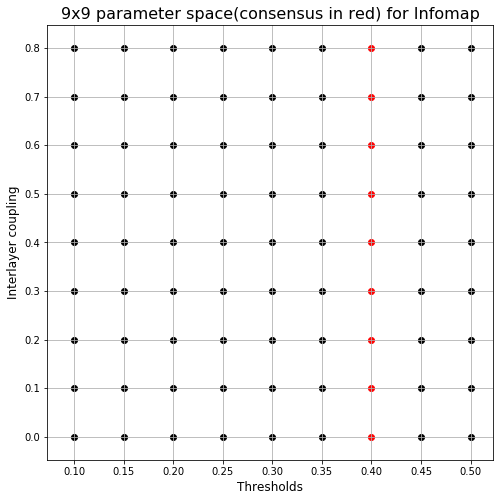

In [40]:
fig,ax = plt.subplots(1,1, figsize = (8,8))
for i in range(9):
    if i ==6:
        ax.scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax.scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax.set_xticks(threshs)
ax.set_yticks(inters)
ax.set_xlabel('Thresholds', fontsize = 12)
ax.set_ylabel('Interlayer coupling', fontsize = 12)
ax.set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax.grid(True)
#plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'parameter_space_%s.pdf'%(e))

## Control

In [70]:
e = trackable[0]
f = epochs[0]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery1 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery1[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+6:i*len(inters)+7]##
    
consensus_partition1 = community_consensus_iterative(max_recovery1)##

comms1, cmap1, color1 = consensus_display(consensus_partition1, n, t)##

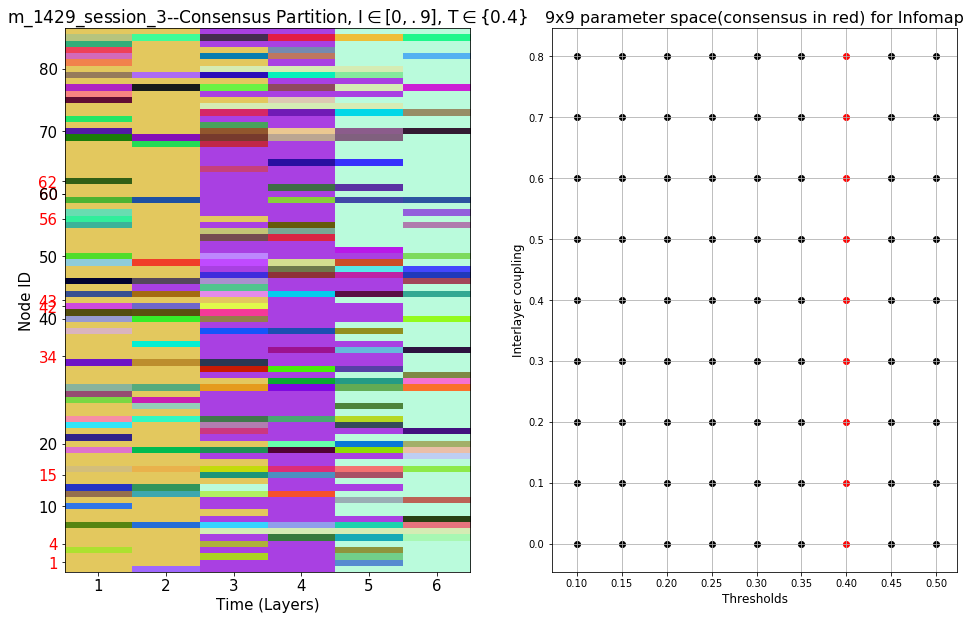

In [71]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms1, interpolation = 'none', cmap = cmap1, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==6:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 34.6 s, sys: 3.23 s, total: 37.8 s
Wall time: 27 s


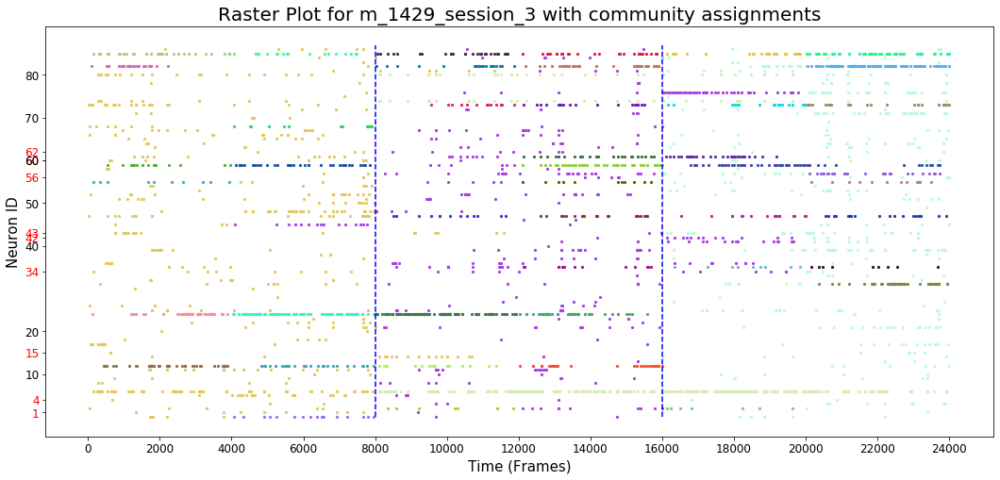

In [72]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color1[int(comms1[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap1)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))

## Epileptic 1

In [73]:
e = trackable[1]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [74]:
e = trackable[1]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery2 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery2[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+5:i*len(inters)+6]##
    
consensus_partition2 = community_consensus_iterative(max_recovery2)##

comms2, cmap2, color2 = consensus_display(consensus_partition2, n, t)##

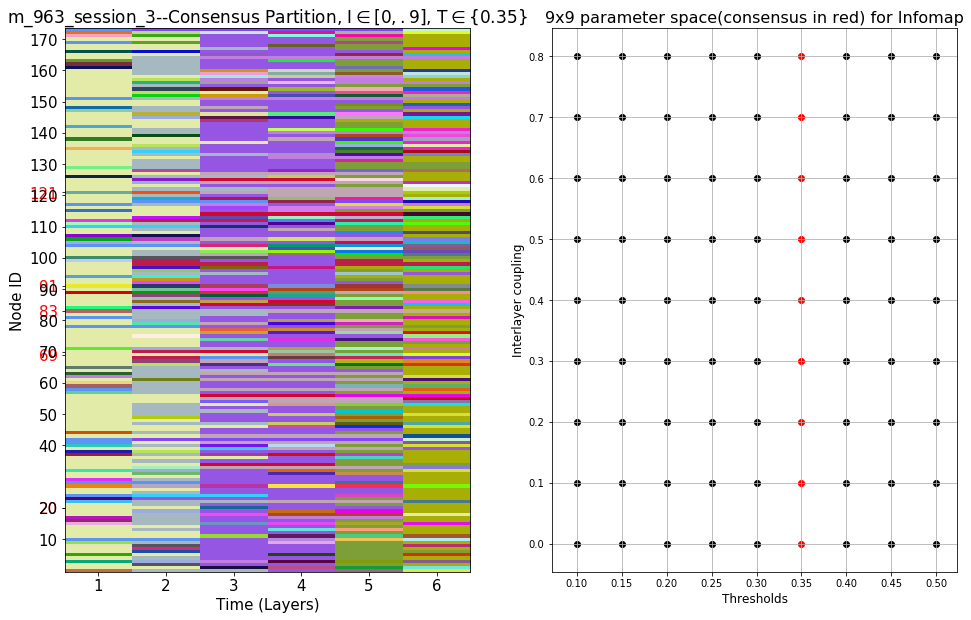

In [75]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms2, interpolation = 'none', cmap = cmap2, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.35\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110,120,130,140,150,160,170])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==5:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 19min 56s, sys: 1min 34s, total: 21min 31s
Wall time: 13min 5s


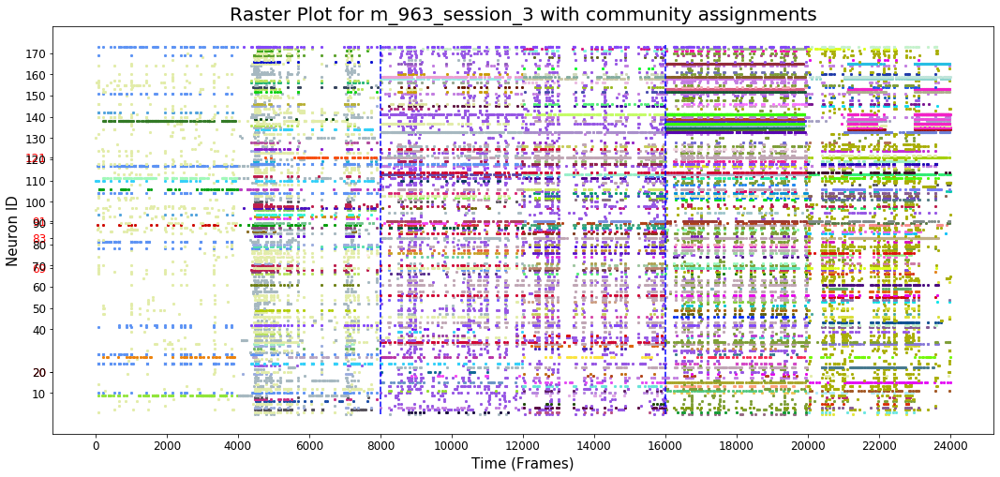

In [77]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color2[int(comms2[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap2)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110,120,130,140,150,160,170])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))

## Epileptic 2

In [78]:
e = trackable[2]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [88]:
e = trackable[2]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery3 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery3[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+2:i*len(inters)+3]##
    
consensus_partition3 = community_consensus_iterative(max_recovery3)##

comms3, cmap3, color3 = consensus_display(consensus_partition3, n, t)##

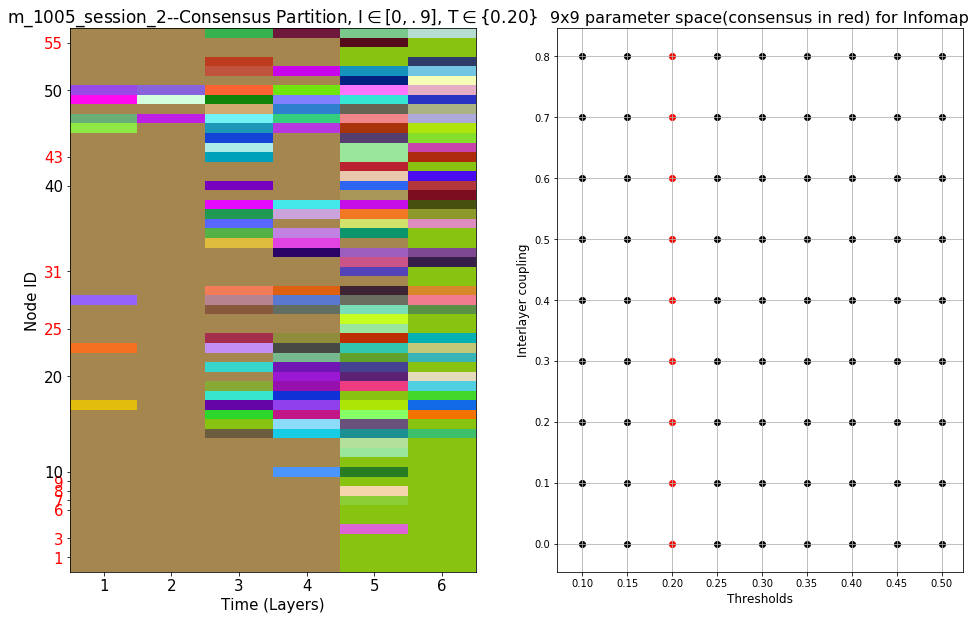

In [89]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms3, interpolation = 'none', cmap = cmap3, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.20\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==2:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 12min 36s, sys: 1min 1s, total: 13min 38s
Wall time: 8min 36s


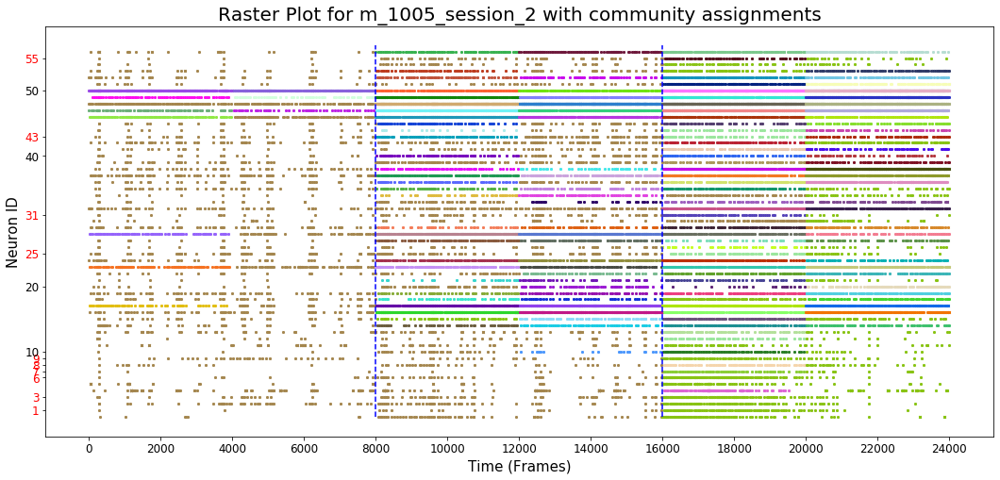

In [91]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color3[int(comms3[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap3)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))

## Epileptic 3

In [92]:
e = trackable[3]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [93]:
e = trackable[3]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery4 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery4[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+4:i*len(inters)+5]##
    
consensus_partition4 = community_consensus_iterative(max_recovery4)##

comms4, cmap4, color4 = consensus_display(consensus_partition4, n, t)##

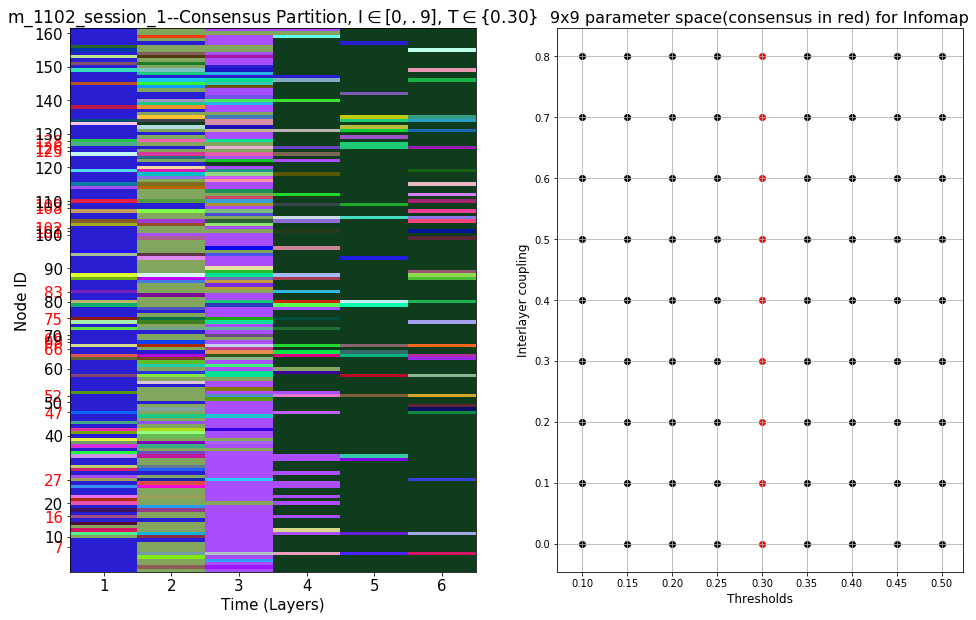

In [96]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms4, interpolation = 'none', cmap = cmap4, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.30\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110,120,130,140,150,160])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==4:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 8min 14s, sys: 41.6 s, total: 8min 55s
Wall time: 5min 37s


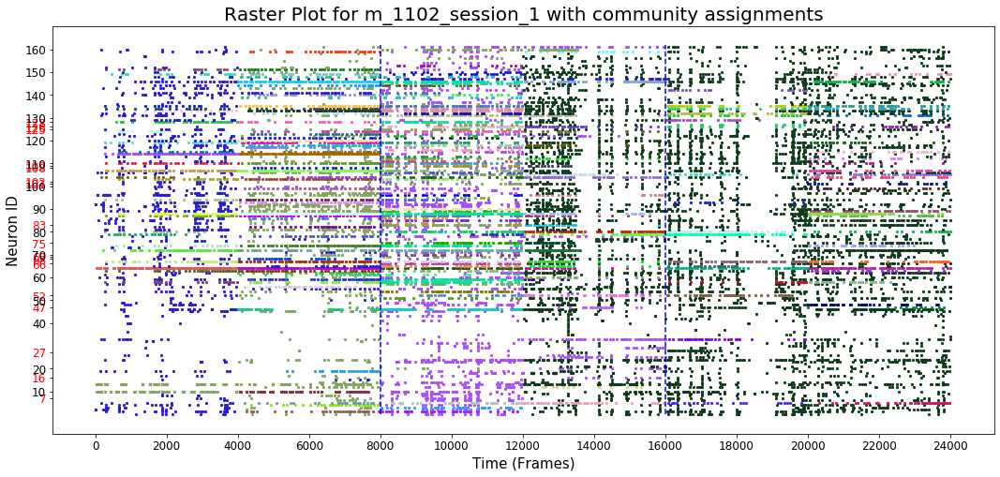

In [97]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color4[int(comms4[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap4)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110,120,130,140,150,160])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))

## Epileptic 4

In [98]:
e = trackable[4]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [99]:
e = trackable[4]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery5 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery5[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+6:i*len(inters)+7]##
    
consensus_partition5 = community_consensus_iterative(max_recovery5)##

comms5, cmap5, color5 = consensus_display(consensus_partition5, n, t)##

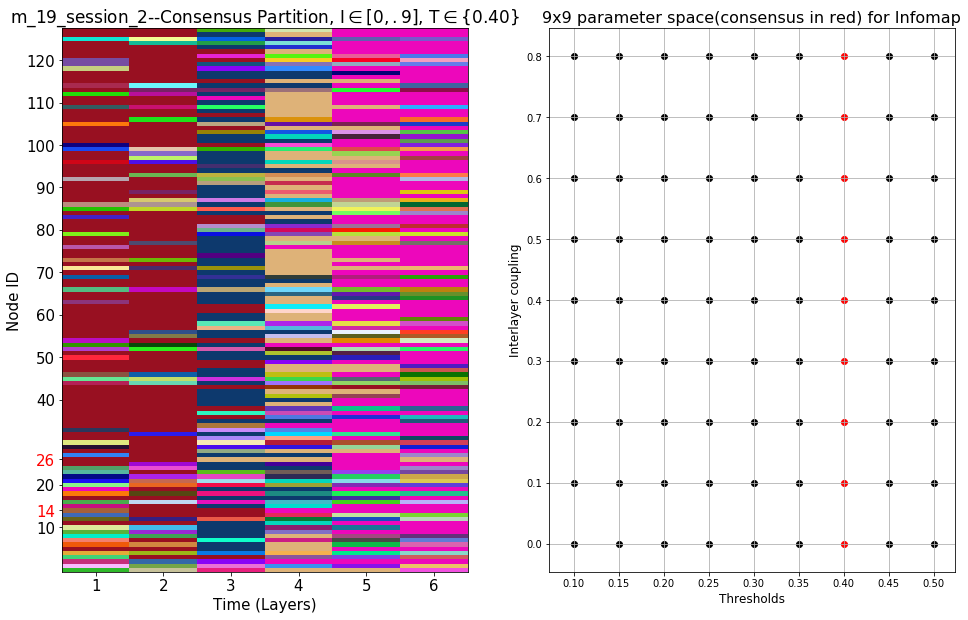

In [102]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms5, interpolation = 'none', cmap = cmap5, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.40\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110,120])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==6:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 4min 57s, sys: 25.4 s, total: 5min 23s
Wall time: 3min 12s


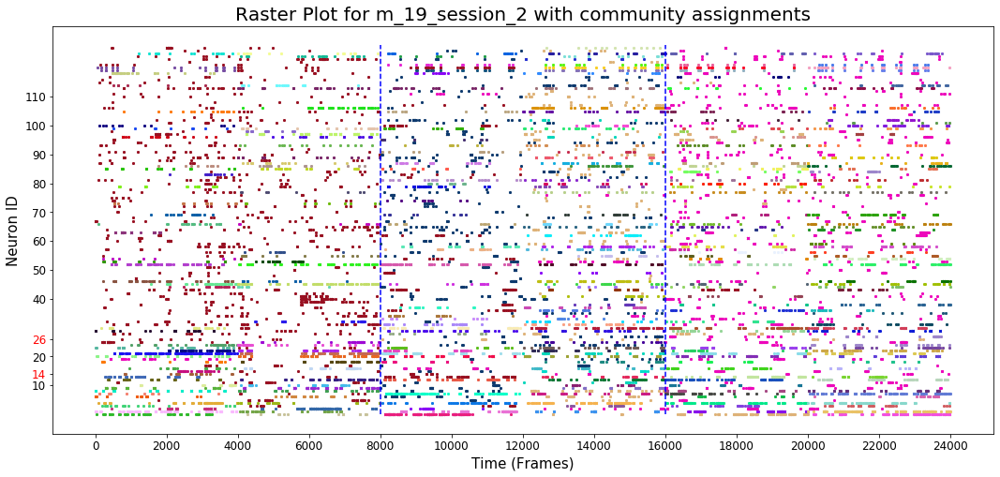

In [104]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color5[int(comms5[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap5)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))

## Epileptic 5

In [105]:
e = trackable[5]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [106]:
e = trackable[5]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery6 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery6[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+5:i*len(inters)+6]##
    
consensus_partition6 = community_consensus_iterative(max_recovery6)##

comms6, cmap6, color6 = consensus_display(consensus_partition6, n, t)##

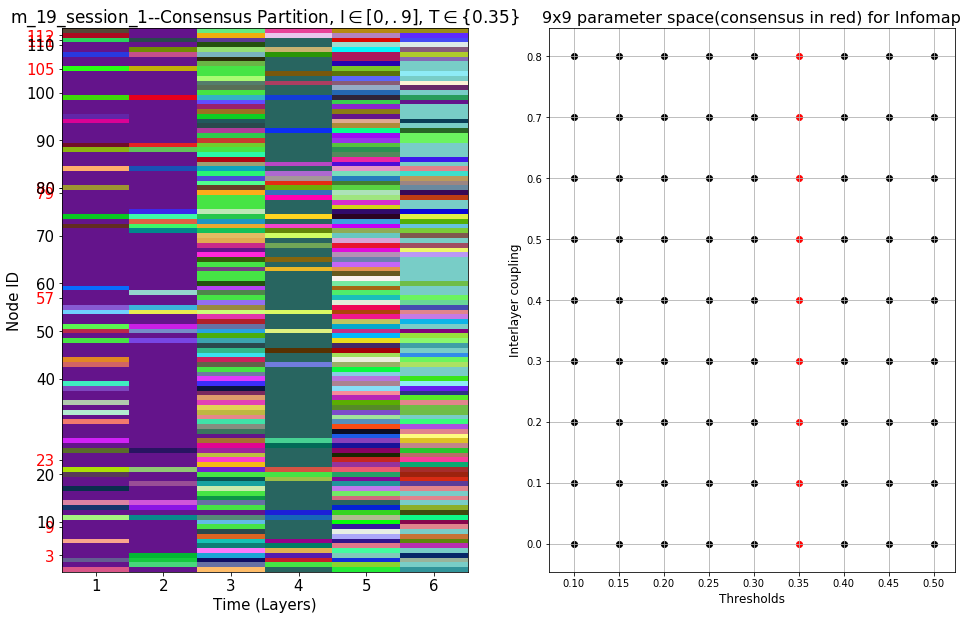

In [108]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms6, interpolation = 'none', cmap = cmap6, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.35\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==5:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 4min 6s, sys: 21.7 s, total: 4min 28s
Wall time: 3min 9s


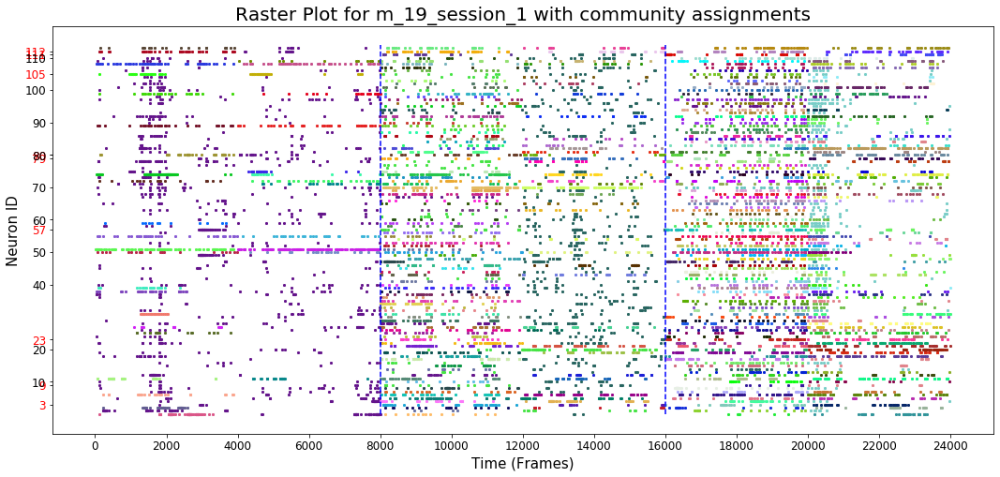

In [109]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color6[int(comms6[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap6)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90,100,110])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))

## Epileptic 6

In [110]:
e = trackable[6]
fig,ax = plt.subplots(9,9, figsize = (9*15+5,9*15))
for i in range(9):
    for j in range(9):
        comms, c = TNs['%s'%(e)].community(membership['%s'%(e)]['interlayer=%.3f'%inters[i]][j], ax[i][j])
        ax[i][j].set_xticks([i for i in range(layers)])
        ax[i][j].set_yticks([i*10 for i in range(int(num_rois_trackable['%s'%(e+f)]/10)+1)])
        ax[i][j].tick_params(axis = 'both', labelsize = 12)
        ax[i][j].set_xlabel('Layers (Time)', fontsize = 25)
        ax[i][j].set_ylabel('Neuron ID', fontsize = 25)
        ax[i][j].set_title('%d Communities, interlayer:%.3f, threshold:%.3f'%(len(c),inters[i],threshs[j]), fontsize=29)
plt.tight_layout()
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'communities_%s.pdf'%(e))

In [112]:
e = trackable[6]
n = num_rois_trackable['%s'%(e+f)]##
t = 6
max_recovery7 = np.zeros((9,n*t))##
for i in range(1,len(inters)):##
    max_recovery7[(i-1)*1:(i)*1] = labels['%s'%(e)][i*len(inters)+5:i*len(inters)+6]##
    
consensus_partition7 = community_consensus_iterative(max_recovery7)##

comms7, cmap7, color7 = consensus_display(consensus_partition7, n, t)##

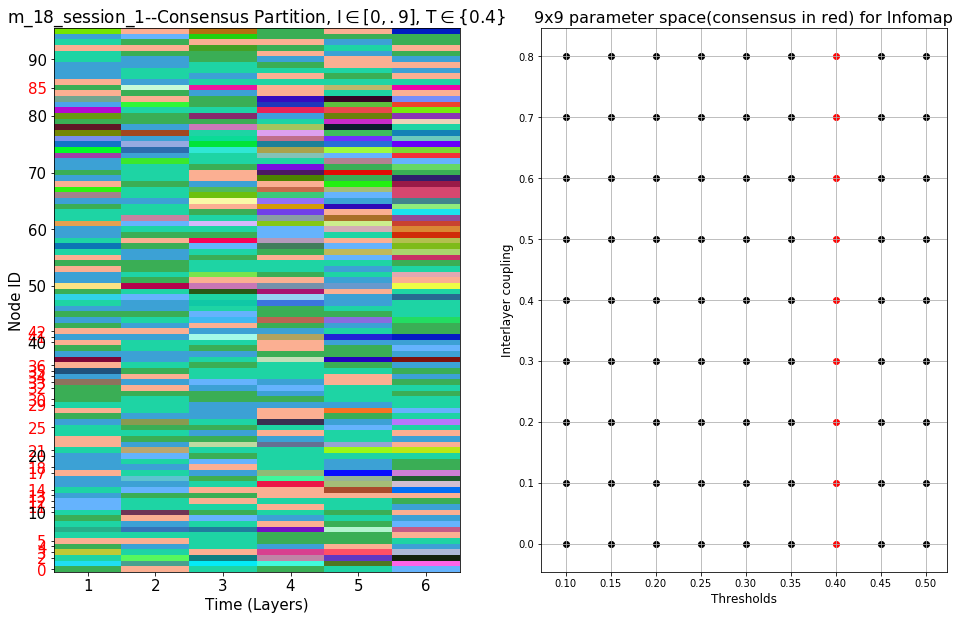

In [114]:
fig,ax = plt.subplots(1,2,figsize = (16,10))
ax[0].imshow(comms7, interpolation = 'none', cmap = cmap7, 
          aspect = 'auto', origin = 'lower', extent = [0.5,6+0.5,-0.5,n-0.5])
ax[0].set_title(r'%s--Consensus Partition, I$\in [0,.9]$, T$\in \{0.4\}$'%(e), fontsize = 17)
ax[0].set_xlabel('Time (Layers)', fontsize = 15)
ax[0].set_ylabel('Node ID', fontsize = 15)
ax[0].set_xticks([1,2,3,4,5,6])
ax[0].set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax[0].get_yticklabels()[i].set_color("red")
ax[0].tick_params(axis = 'both', labelsize = 15)

for i in range(9):
    if i ==6:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'red')
    else:
        ax[1].scatter(threshs[i]*np.ones(9), inters, c = 'black')
ax[1].set_xticks(threshs)
ax[1].set_yticks(inters)
ax[1].set_xlabel('Thresholds', fontsize = 12)
ax[1].set_ylabel('Interlayer coupling', fontsize = 12)
ax[1].set_title('9x9 parameter space(consensus in red) for Infomap', fontsize = 16)
ax[1].grid(True)
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'Consensus_and_parameter_space_%s.pdf'%(e))

CPU times: user 2min 48s, sys: 15.2 s, total: 3min 3s
Wall time: 2min 9s


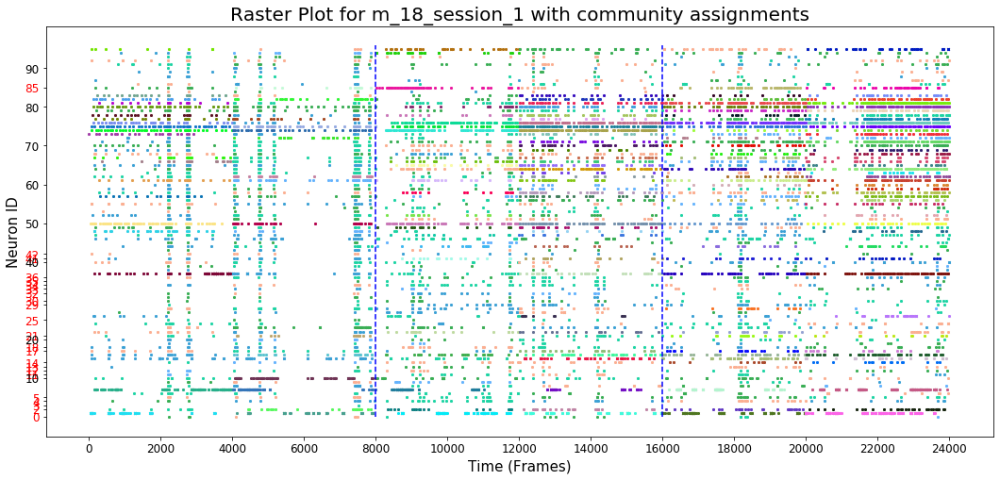

In [115]:
%%time
binsize = 4000
binned_spikes = bin_time_series(merged_spikes['%s'%e], binsize, gaussian = False)##
l,n,t = binned_spikes.shape
                    
sp = np.nonzero(binned_spikes)

fig,ax = plt.subplots(1,1,figsize = (18,8)) 
for i in range(len(sp[0])):
    ax.scatter(sp[0][i]*binsize+sp[2][i],  
               sp[1][i], 
               s = 5, 
               c = color7[int(comms7[sp[1][i]][sp[0][i]])], 
               marker = 'x', cmap = cmap7)
    
ax.set_title('Raster Plot for %s with community assignments'%e, fontsize = 20)
ax.set_xlabel('Time (Frames)', fontsize = 15)
ax.set_ylabel('Neuron ID', fontsize = 15)
ax.set_xticks([t*i for i in range(l+1)])
ax.set_yticks([10*i for i in range(int(n/10)+1)]+[n])
ax.set_xticks([2000*i for i in range(13)])
ax.set_yticks(pvs['%s'%(e)][0]+[10,20,40,50,60,70,80,90])
for i,k in enumerate(pvs['%s'%(e)][0]):
    ax.get_yticklabels()[i].set_color("red")
ax.tick_params(axis = 'both', labelsize = 12)
ax.vlines(8000, 0, n, colors = 'b', linestyle = 'dashed')
ax.vlines(16000, 0, n, colors = 'b', linestyle = 'dashed')
plt.savefig(path + 'infomap_results_merged/' + '%s/'%e + 'raster_plot_consensused_%s.pdf'%(e))